In [1]:
import jax.numpy as np
import matplotlib.pyplot as plt
import jax
import jax.scipy as jsp

jax.config.update("jax_enable_x64", True)
import scipy
width = 1000
height = 1000
np.zeros((width, height))
key = jax.random.PRNGKey(0)

## Plot here the starry sky

In [2]:
def temperature_to_rgb(temperature):
    temperature /= 100.0
    if temperature <= 66:
        red = 255
    else:
        red = temperature - 60.0
        red = 329.698727446 * (red ** -0.1332047592)
        red = np.maximum(0, np.minimum(255, red))

    if temperature <= 66:
        green = temperature
        green = 99.4708025861 * np.log(green) - 161.1195681661
        green = np.maximum(0, np.minimum(255, green))
    else:
        green = temperature - 60.0
        green = 288.1221695283 * (green ** -0.0755148492)
        green = np.maximum(0, np.minimum(255, green))

    if temperature >= 66:
        blue = 255
    elif temperature <= 19:
        blue = 0
    else:
        blue = temperature - 10.0
        blue = 138.5177312231 * np.log(blue) - 305.0447927307
        blue = np.maximum(0, np.minimum(255, blue))

    return np.array([red,green,blue])

In [3]:
temperature_to_rgb(10)

Array([255.,   0.,   0.], dtype=float64)

In [4]:
def ball(x, y, center_x, center_y, radius):
  dx = x - center_x
  dy = y - center_y
  return (np.sqrt(dx*dx + dy*dy) < radius) * 0.1


def star(x, y, center_x, center_y, inv_radius, color):
  dx = x - center_x
  dy = y - center_y
  brightness = 1/(0.01 + np.sqrt(dx*dx + dy*dy) * inv_radius)**50
  return brightness[..., None] * temperature_to_rgb(color)

In [5]:
def generate_many_balls(xs, ys):
  image = 0.0
  for i in range(100):
    image += ball(xs, ys, np.random.random(), np.random.random(), np.random.random()*0.1)
  return image


def generate_many_stars(xs, ys, key, num_stars=1000, min_radius=0.01, radius_scale=0.1, min_temperature=2000, temperature_scale=50000):
  image = 0.0
  for i in range(num_stars):
    key, s1, s2, s3, s4 = jax.random.split(key, num=5)
    image += star(xs, ys, jax.random.uniform(s1), jax.random.uniform(s2), min_radius+jax.random.uniform(s3)*radius_scale,  min_temperature+jax.random.uniform(s4)*temperature_scale)
  return image

In [6]:
xs = np.linspace(0, 1, 5000)
ys = np.linspace(0, 1, 5000)

xs2 = xs[None, :]
ys2 = ys[:, None]

#mage = star(xs2, ys2, 0.5, 0.5, 0.2)
#image = generate_many_balls(xs2, ys2)
image = generate_many_stars(xs2, ys2, key)

(-0.5, 4999.5, 4999.5, -0.5)

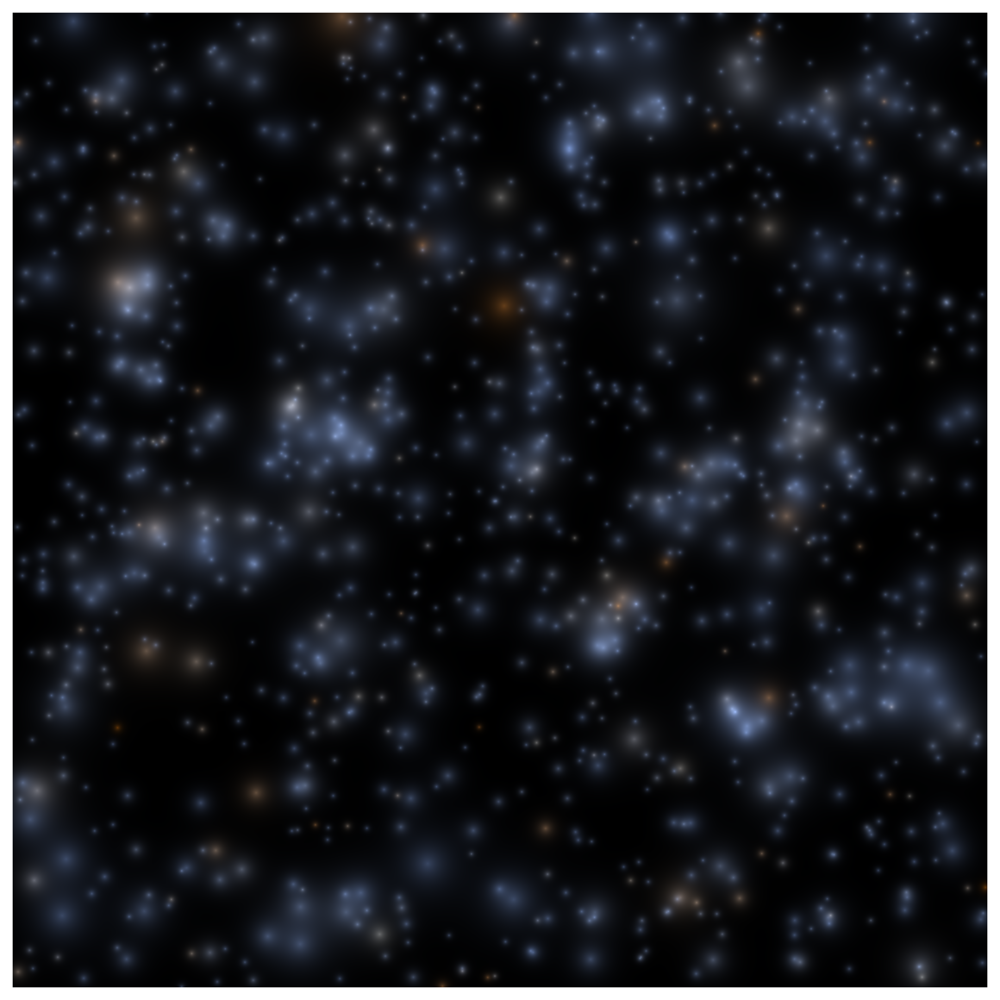

In [8]:
plt.figure(figsize=(10, 10), dpi=400)
plt.imshow(image/np.max(image), cmap='gray')
plt.axis('off')


In [9]:
norm_image = image/np.max(image)

(-0.5, 4999.5, 4999.5, -0.5)

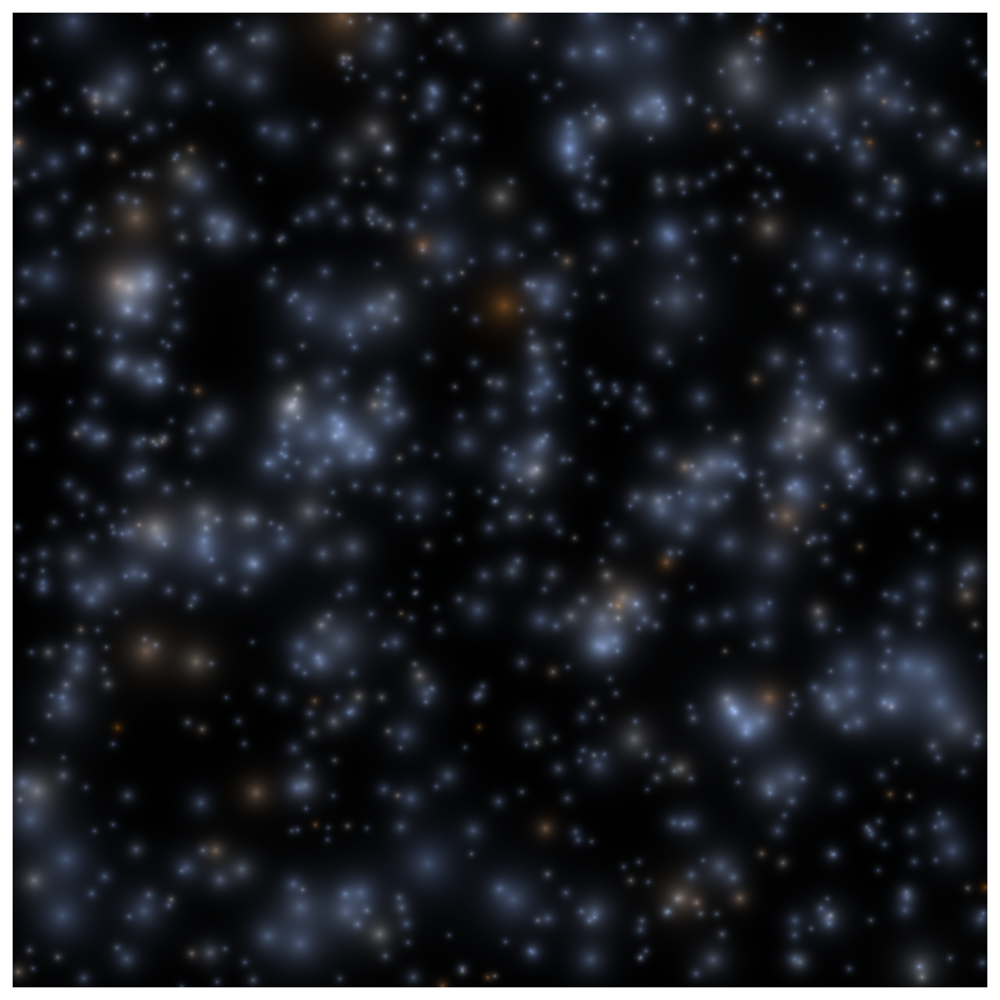

In [10]:
plt.figure(figsize=(10, 10), dpi=400)
plt.imshow(norm_image**0.9, cmap='gray')
plt.axis('off')


In [11]:
image2 = generate_many_stars(xs2, ys2, key, num_stars=2000, min_radius=0.005, radius_scale=0.06)

(-0.5, 4999.5, 4999.5, -0.5)

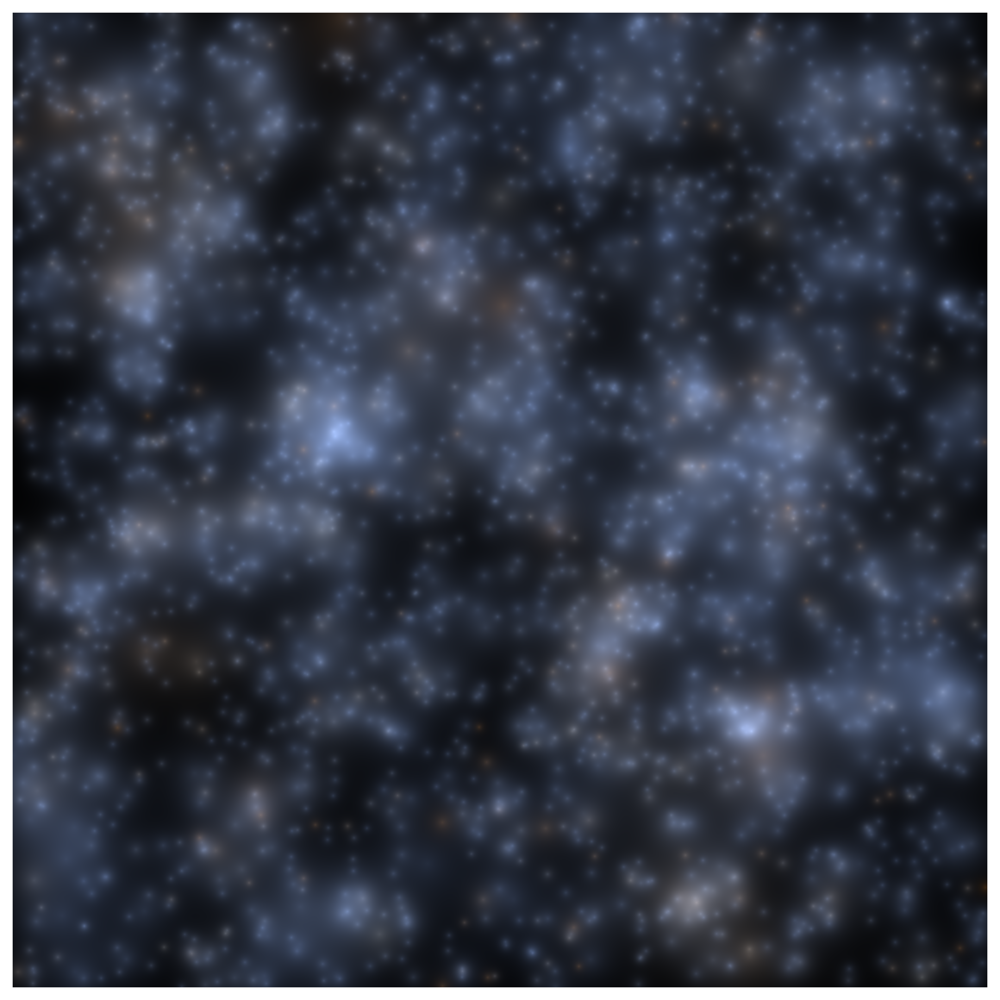

In [12]:
norm_image2 = image2/np.max(image2)

plt.figure(figsize=(10, 10), dpi=400)
plt.imshow(norm_image2, cmap='gray')
plt.axis('off')


## Plot here the Dot




In [13]:
xs = np.linspace(0, 1, 100)[None, :]
ys = np.linspace(0, 1, 100)[:, None]

In [14]:
def dot(x, y, center_x, center_y, radius, color):
  dx = x - center_x
  dy = y - center_y
  brightness = (np.maximum(0, (1 - np.sqrt(dx*dx + dy*dy)/radius))**0.1)[..., None]
  print(temperature_to_rgb(color)[None, None, ...].shape)
  print(brightness.shape)
  print(temperature_to_rgb(color))
  return np.concatenate( [np.broadcast_to(temperature_to_rgb(color)[None, None, ...], brightness.shape[:-1] + (3,)), brightness], axis=-1)

(1, 1, 3)
(100, 100, 1)
[ 96.74897667 143.78535244 255.        ]
(1, 1, 3)
(100, 100, 1)
[ 96.74897667 143.78535244 255.        ]


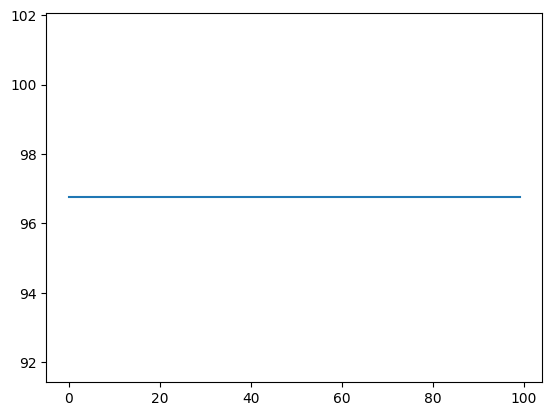

In [15]:
dot(xs, ys, 0.5, 0.5, 0.5, 1000000)
plt.plot(dot(xs, ys, 0.5, 0.5, 0.5, 1000000)[50, :, 0])

In [16]:
s = dot(xs, ys, 0.5, 0.5, 0.5, 6700)
s = np.concatenate([s[..., :3], (s[..., -1] / np.max(s[..., -1]) * 255)[..., None]], axis=-1)
s = np.array(s, dtype=np.int32)
 #s = np.where(s < 0.1, 0, s)

(1, 1, 3)
(100, 100, 1)
[254.41703673 248.74778674 255.        ]


In [17]:
np.max(s[..., -1])

Array(255, dtype=int32)

In [18]:
s.shape

(100, 100, 4)

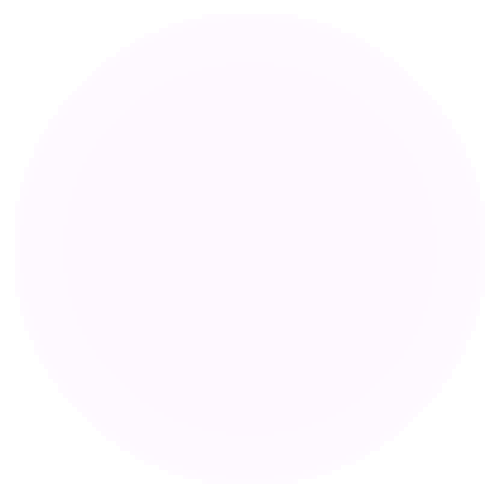

In [19]:
plt.subplots(1, 1, facecolor=(1, 1, 0, 0))

plt.gca().set_axis_off()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
            hspace = 0, wspace = 0)
plt.margins(0,0)
plt.gca().patch.set_alpha(0.0)

plt.imshow(s)



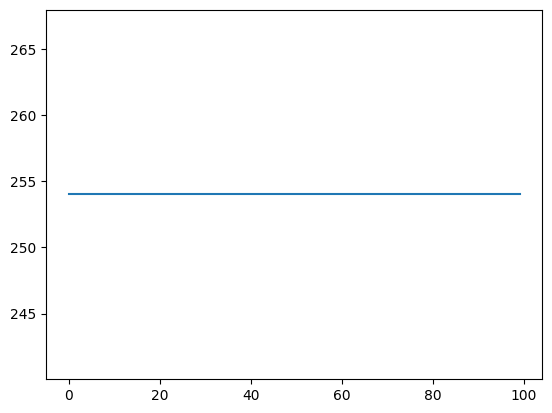

In [20]:
plt.plot(s[50, :, 0])